In [11]:
# define id (full id account)
INSTANCE_ID = '042dbf75-1db4-48af-aa2c-beee173d3339'  
# aldready inputted into config file. In case you put instance ID into cofniguration file you can leave this unchanged

In [12]:
# option settings
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [13]:
# import libraries
import matplotlib.pyplot as plt
import numpy as np
import datetime
from base64 import b64encode
from ipyleaflet import Map, WMSLayer
from sentinelhub.data_request import WmsRequest, WcsRequest
from sentinelhub.constants import MimeType, CustomUrlParam
from sentinelhub.common import BBox, CRS
from time_lapse import SentinelHubTimelapse
# from sentinelhub import WmsRequest, WcsRequest, MimeType, CRS, BBox, CustomUrlParam, DataSource

In [14]:
via_santo_domingo = BBox(bbox=[-79.07117843627931, -0.36443464592242975,
                               -78.9027786254883, -0.29577123885678364], 
                         crs=CRS.WGS84)

time_interval = ['2015-01-01', '2018-05-18']

In [15]:
# Set size of full resolution images. In this case a format for generating .gifs and video to Twitter is used
tl_size = (int(1920/2), int(1080/2))

Create an instance of the SentinelHubTimelapse class with the specified parameters. Arguments of the class include full_size, preview_size, use_atmcor, and time_difference. Custom layers can be specified using the layers argument for the preview and full resolution images. The time_difference arguments specifies the time interval used to merge two or more requests.

In [16]:
santo_doming_timelapse = SentinelHubTimelapse('via_santo_domingo_4', #name-> change for new iteration
                                        via_santo_domingo, #bbox
                                        time_interval, #time range
                                        INSTANCE_ID, #instance id
                                        layer='TRUE_COLOR', #layer
                                        full_size=tl_size) #size dimension

INFO:time_lapse:Found 119 images of via_santo_domingo_4 between 2015-01-01 and 2018-05-18.
INFO:time_lapse:
I suggest you start by downloading previews first to see,
if BBOX is OK, images are usefull, etc...
Execute get_previews() method on your object.



INFO:time_lapse:119 previews have been downloaded and stored to numpy array of shape (119, 256, 455, 3).


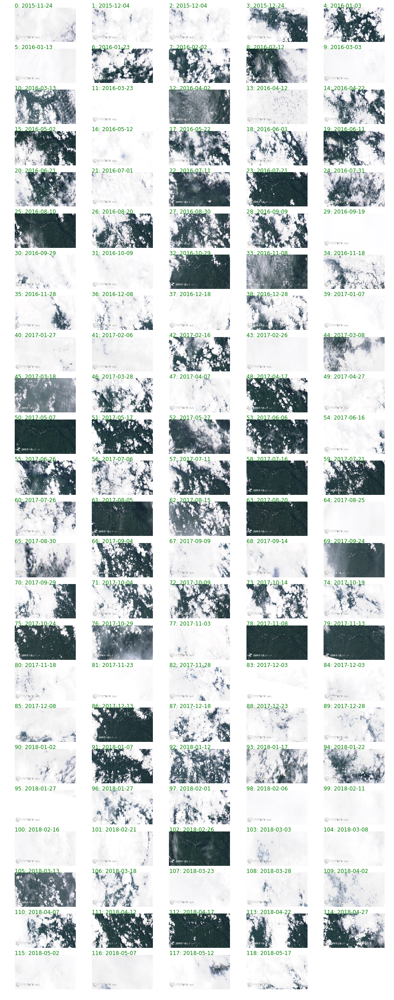

In [17]:
# get and preview image (Previews are saved locally into a ./previews/ folder)
santo_doming_timelapse.get_previews()
santo_doming_timelapse.plot_preview(filename='previews.pdf')

In [18]:
# Download full-resolution images
santo_doming_timelapse.save_fullres_images()

In [19]:
# add date stamp to photos
santo_doming_timelapse.create_date_stamps()
santo_doming_timelapse.create_timelapse(scale_factor=0.2)

##### Apply Sentinel-Hub's cloud detector on full-res images

This step runs a classifier based on Gradient Boosting Machines, which was trained and tested internally. To use this classifier you need to insstall the Sentinel-Hub s2cloudless Python package. The ```max_cloud_coverage``` is used to filter out images used in the time-lapse. In this example, images with a cloud coverage greater than 1% are discarded.

In [20]:
# cloud covrage threshold
cc_thres = 0.1

santo_doming_timelapse.mask_cloudy_images(max_cloud_coverage=cc_thres)

INFO:time_lapse:Downloading cloud data and running cloud detection. This may take a while.


Visualise cloud masks and display cloud coverage as estimated by the classifier. Previews with a red tag are discarded from time-lapse. A ```binary``` colourmap is used, therefore clouds appear in black.

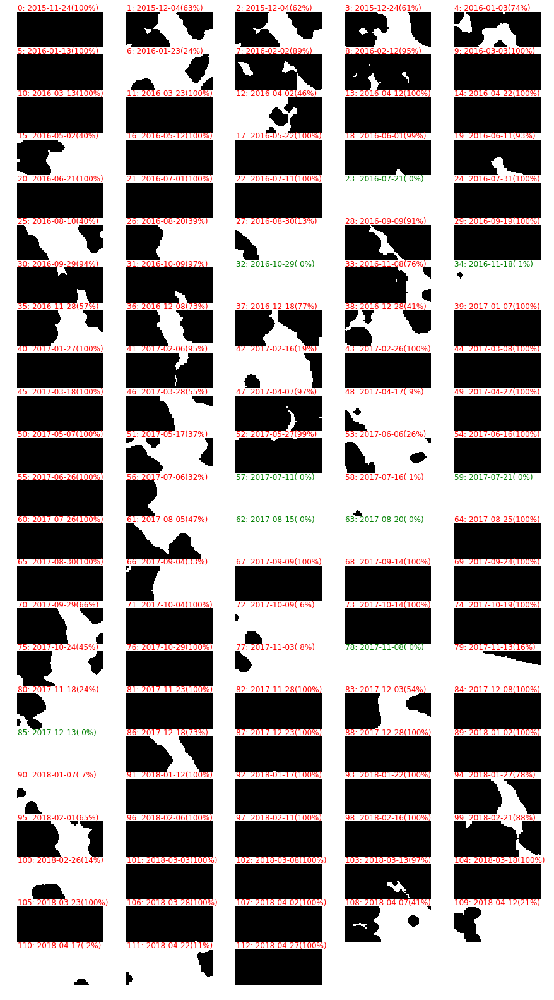

In [46]:
santo_doming_timelapse.plot_cloud_masks(filename='cloudmasks.pdf')

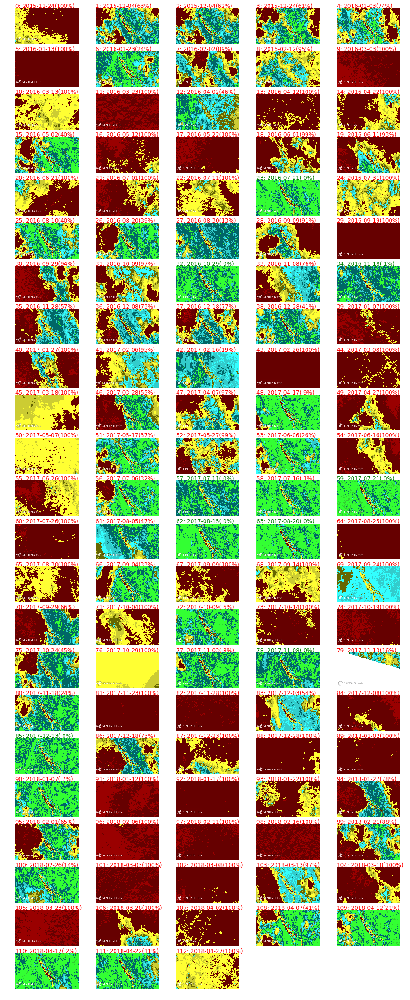

In [47]:
# Preview cloud masks overlayed onto full-res images.  
santo_doming_timelapse.plot_preview(filename='previews_with_cc.pdf')

Create date stamps to add to time-lapse

In [48]:
santo_doming_timelapse.create_date_stamps()
santo_doming_timelapse.create_timelapse(scale_factor=0.2)

##### Create time-lapse in gif format

A timelapse.gif will be created in the project folder. In this example, within the `daxing-airport-twitter` folder. Frames-per-second can be set via `fps` argument.

In [49]:
santo_doming_timelapse.make_gif(fps=8, filename='santo_doming_timelapse_8fps.gif')

##### Create time-lapse in *.avi format

In [50]:
santo_doming_timelapse.make_video(fps=10, filename='santo_doming_timelapse_10fps.avi')

### Manually filtering out frames

In some cases it may be necessary to manually mask or unmask individual images. This can be done using the `mask_images` or `unmask_images` method, where individual images are masked or unmasked based on their indices (as seen for example in the previews file).

In [16]:
mask_images = [191]
daxing_timelapse.mask_images(mask_images)
daxing_timelapse.create_date_stamps()
daxing_timelapse.create_timelapse(scale_factor=0.2)

Re-creating the time-lapse as gif and video with the manually specified frames leads to a better visual result.

In [17]:
daxing_timelapse.make_gif(fps=8)
daxing_timelapse.make_video(fps=12, filename='daxing_airport_12fps.avi')

##### Function wrapper

If you want to repeat the previous steps systematically, a wrapper function can be created as below.

In [23]:
def make_timelapse(msg, bbox, time_interval, *, full_size=(int(1920 / 4.1), int(1080 / 4.1)), mask_images=[],
                   max_cc=0.01, scale_factor=0.2, fps=8, instance_id=INSTANCE_ID, **kwargs):
    timelapse = SentinelHubTimelapse(msg, bbox, time_interval, instance_id,
                                     full_size=full_size, **kwargs)
    timelapse.get_previews()
    timelapse.save_fullres_images()
    timelapse.plot_preview(filename='previews.pdf')
    timelapse.mask_cloudy_images(max_cloud_coverage=max_cc)
    timelapse.plot_cloud_masks(filename='cloudmasks.pdf')
    timelapse.plot_preview(filename='previews_with_cc.pdf')
    timelapse.mask_images(mask_images)
    timelapse.create_date_stamps()
    timelapse.create_timelapse(scale_factor=scale_factor)

    timelapse.make_gif(fps=fps)
    timelapse.make_video(fps=fps)

The following examples use this wrapper function to create time-lapses in few lines of code.

## Sahara Pivot Irrigation Fields

Time-lapse example of [Pivot Irrigation Fields](https://en.wikipedia.org/wiki/Center_pivot_irrigation) in the Sahara desert.

INFO:time_lapse:Found 120 images of sahara-fields-mediumres between 2015-01-01 and 2018-05-18.
INFO:time_lapse:
I suggest you start by downloading previews first to see,
if BBOX is OK, images are usefull, etc...
Execute get_previews() method on your object.

INFO:time_lapse:120 previews have been downloaded and stored to numpy array of shape (120, 256, 455, 3).
INFO:time_lapse:Downloading cloud data and running cloud detection. This may take a while.


IndexError: index 170 is out of bounds for axis 0 with size 120

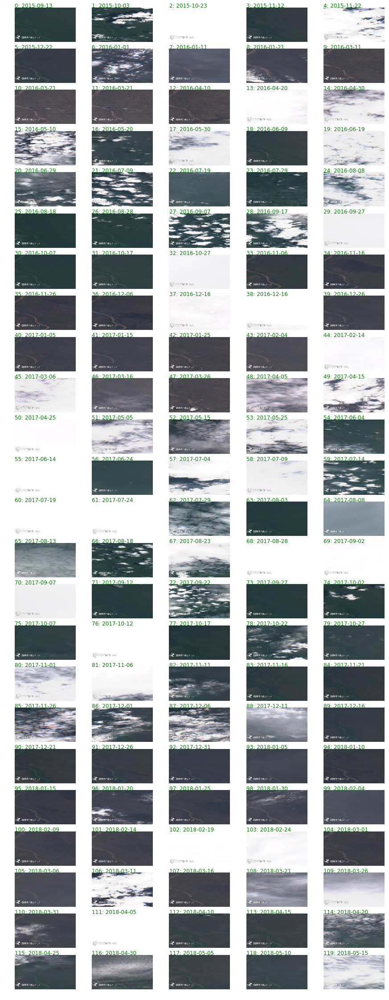

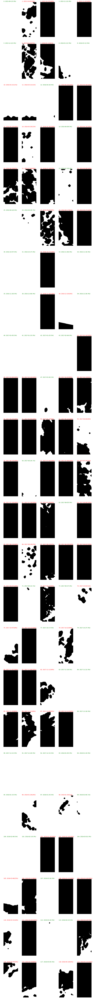

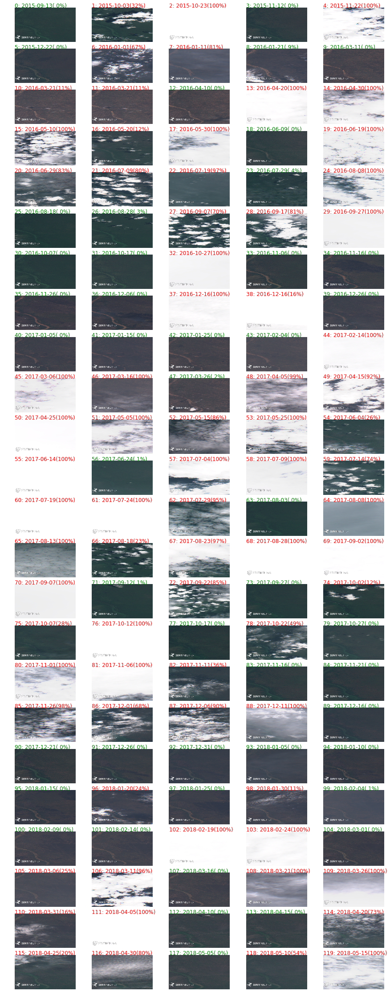

In [24]:
sahara_fields = BBox(bbox=[33.33518945652781, 6.657371520996095, 33.371896708270015, 6.745262145996094],
                     crs=CRS.WGS84)

mask_idxs = [7, 96, 112, 170, 186, 190]

make_timelapse(msg='sahara-fields-mediumres', bbox=sahara_fields, time_interval=time_interval,
               mask_images=mask_idxs, max_cc=0.1, scale_factor=0.2)